In [ ]:
!pip install transformers==4.30.2
!pip install git+https://github.com/openai/CLIP.git
!pip install keybert
!pip install sentence-transformers
!pip install timm
!pip install torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-7s3atclh
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-7s3atclh
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Using cached ftfy-6.3.1-py3-none-any.whl.metadata (7.3 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cur

Saving IMG_1497.PNG to IMG_1497 (1).PNG


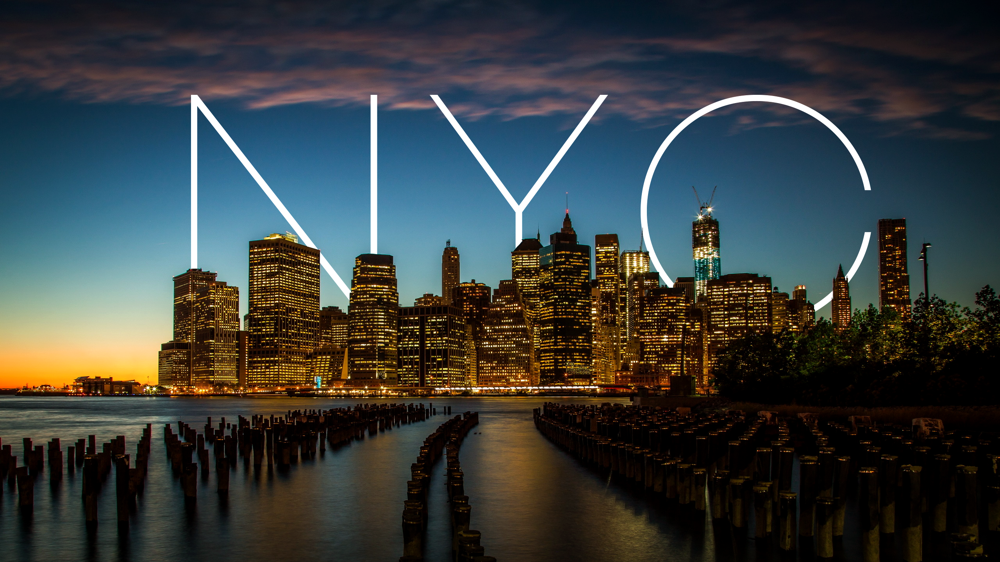

In [ ]:
from PIL import Image
import requests
from io import BytesIO
from IPython.display import display

# === OPTION 1: Upload image manually ===
from google.colab import files
uploaded = files.upload()

# Load the uploaded image (if you uploaded one)
for file_name in uploaded:
    image_path = file_name
    break

# === OPTION 2: Load from URL ===
# Uncomment and paste a URL below to use an image from the internet
# url = "https://your-image-url.jpg"
# response = requests.get(url)
# image = Image.open(BytesIO(response.content)).convert("RGB")
# image.save("url_image.jpg")
# image_path = "url_image.jpg"

# Load and show image
image = Image.open(image_path).convert("RGB")
display(image)


In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
import torch

# Load BLIP processor and model
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to("cuda" if torch.cuda.is_available() else "cpu")

# Prepare image for model
inputs = processor(images=image, return_tensors="pt").to("cuda" if torch.cuda.is_available() else "cpu")

# Generate caption
caption_ids = model.generate(**inputs)
caption = processor.decode(caption_ids[0], skip_special_tokens=True)

# Display caption
print("Generated Caption:", caption)


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


📝 Generated Caption: a city skyline


In [ ]:
from keybert import KeyBERT
from sentence_transformers import SentenceTransformer

# Load sentence-transformer model
sbert_model = SentenceTransformer("all-MiniLM-L6-v2")
kw_model = KeyBERT(model=sbert_model)

# Extract keywords
keywords = kw_model.extract_keywords(caption, keyphrase_ngram_range=(1, 2), stop_words='english', top_n=5)
tags = [kw[0] for kw in keywords]

# Show extracted tags
print(" Extracted Tags:", tags)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

🏷️ Extracted Tags: ['city skyline', 'skyline', 'city']


In [ ]:
import clip
import torch
import torchvision.transforms as transforms

# Load CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

# Preprocess image for CLIP
clip_image = clip_preprocess(image).unsqueeze(0).to(device)

# Prepare tag texts
text_tokens = clip.tokenize(tags).to(device)

# Get image and text embeddings
with torch.no_grad():
    image_features = clip_model.encode_image(clip_image)
    text_features = clip_model.encode_text(text_tokens)

# Normalize and compute cosine similarity
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = (image_features @ text_features.T).squeeze(0)

# Filter tags based on similarity threshold
threshold = 0.25
final_tags = [tag for tag, score in zip(tags, similarity) if score.item() >= threshold]

# Print final results
print(" Final Visually Relevant Tags:", final_tags)


100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 59.5MiB/s]


✅ Final Visually Relevant Tags: ['city skyline', 'skyline', 'city']


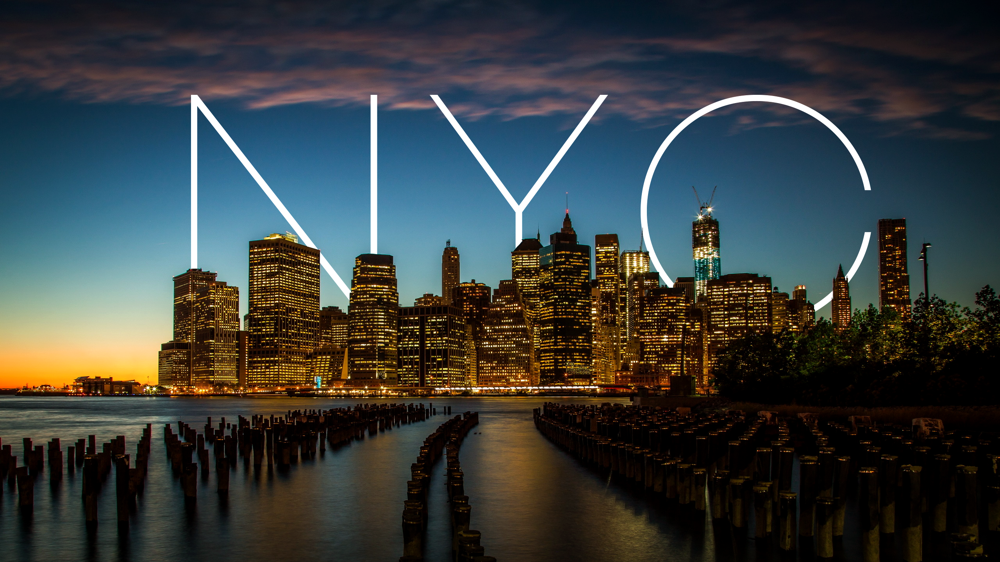

###  Image Caption

a city skyline


###  Initial Tags (from KeyBERT)

['city skyline', 'skyline', 'city']


###  Final Visually Relevant Tags (after CLIP filtering)

['city skyline', 'skyline', 'city']


In [ ]:
from IPython.display import display, Markdown

display(image)

display(Markdown("###  Image Caption"))
print(caption)

display(Markdown("###  Initial Tags (from KeyBERT)"))
print(tags)

display(Markdown("###  Final Visually Relevant Tags (after CLIP filtering)"))
print(final_tags)
